In [48]:
# Análisis Geoespacial de PIB departamental en Colombia
# Valentina Guzmán López
# Data Analysis Project | Python | Geospatial Analysis

### Carga del archivo `pib_departamental.csv`

Por favor, sube el archivo `pib_departamental.csv` para que el análisis pueda continuar. Puedes usar el botón 'Choose Files' que aparecerá después de ejecutar la siguiente celda. Una vez cargado el archivo, por favor, ejecuta la celda con `df = pd.read_csv("/content/pib_departamental.csv")` y las celdas subsiguientes.

In [49]:
from google.colab import files
files.upload()

Saving PIB_Departamental_con_proyección_20251215.csv to PIB_Departamental_con_proyección_20251215 (1).csv


{'PIB_Departamental_con_proyección_20251215 (1).csv': b'"A\xc3\xb1o","Actividad","Sector","Tipo de precios","C\xc3\xb3digo Departamento (DIVIPOLA)","Departamento","Valor (miles de millones de pesos)"\n"2,005","Construcci\xc3\xb3n","Secundario","PIB a precios corrientes","97","Vaup\xc3\xa9s","2.28"\n"2,005","Construcci\xc3\xb3n","Secundario","PIB a precios corrientes","99","Vichada","10.23"\n"2,013","Informaci\xc3\xb3n y comunicaciones","Terciario","PIB a precios constantes de 2015","15","Boyac\xc3\xa1","344.68"\n"2,013","Informaci\xc3\xb3n y comunicaciones","Terciario","PIB a precios constantes de 2015","17","Caldas","361.68"\n"2,013","Informaci\xc3\xb3n y comunicaciones","Terciario","PIB a precios constantes de 2015","18","Caquet\xc3\xa1","59.84"\n"2,005","Agricultura, ganader\xc3\xada, caza, silvicultura y pesca","Primario","PIB a precios constantes de 2015","91","Amazonas","114.17"\n"2,013","Informaci\xc3\xb3n y comunicaciones","Terciario","PIB a precios constantes de 2015","85","C

## Contexto

Este proyecto analiza información geoespacial relacionada con el PIB departamental en Colombia, con el objetivo de identificar patrones territoriales y posibles desigualdades regionales.

## Objetivo

- Analizar la distribución territorial de PIB.
- Identificar regiones con mayor concentración.
- Explorar posibles patrones espaciales.

## Metodología

- Carga y exploración inicial de datos
- Limpieza y transformación
- Análisis estadístico descriptivo
- Visualización geoespacial
- Interpretación de resultados

En esta sección se realiza una exploración inicial del conjunto de datos, con el fin de identificar su estructura, variables disponibles y nivel de desagregación temporal y sectorial. El dataset contiene información del PIB departamental desagregada por año, sector económico y actividad.

In [50]:
import pandas as pd

df = pd.read_csv("/content/PIB_Departamental_con_proyección_20251215.csv")
df.head()

,Año,Actividad,Sector,Tipo de precios,Código Departamento (DIVIPOLA),Departamento,Valor (miles de millones de pesos)
0,"2,005",Construcción,Secundario,PIB a precios corrientes,97,Vaupés,2.28
1,"2,005",Construcción,Secundario,PIB a precios corrientes,99,Vichada,10.23
2,"2,013",Información y comunicaciones,Terciario,PIB a precios constantes de 2015,15,Boyacá,344.68
3,"2,013",Información y comunicaciones,Terciario,PIB a precios constantes de 2015,17,Caldas,361.68
4,"2,013",Información y comunicaciones,Terciario,PIB a precios constantes de 2015,18,Caquetá,59.84


In [51]:
!pip -q install geopandas

In [52]:
import os
print(os.listdir('/content/'))

['.config', 'PIB_Departamental_con_proyección_20251215 (1).csv', 'PIB_Departamental_con_proyección_20251215.csv', '.ipynb_checkpoints', 'sample_data']


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16302 entries, 0 to 16301
Data columns (total 7 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Año                                 16302 non-null  object
 1   Actividad                           16302 non-null  object
 2   Sector                              16302 non-null  object
 3   Tipo de precios                     16302 non-null  object
 4   Código Departamento (DIVIPOLA)      16302 non-null  int64 
 5   Departamento                        16302 non-null  object
 6   Valor (miles de millones de pesos)  16302 non-null  object
dtypes: int64(1), object(6)
memory usage: 891.6+ KB


## Análisis de participación sectorial

En esta sección se calcula la participación porcentual de cada sector dentro del PIB total de cada departamento por año, con el objetivo de analizar la estructura productiva territorial.

In [54]:
df.columns

Index(['Año', 'Actividad', 'Sector', 'Tipo de precios',
       'Código Departamento (DIVIPOLA)', 'Departamento',
       'Valor (miles de millones de pesos)'],
      dtype='object')

In [55]:
df["Año"] = (
    df["Año"]
    .astype(str)
    .str.replace(",", "")
    .astype(int)
)

In [56]:
df["Valor (miles de millones de pesos)"] = (
    df["Valor (miles de millones de pesos)"]
    .astype(str)
    .str.replace(",", "")
    .astype(float)
)

En esta sección se realiza una depuración básica del conjunto de datos con el fin de garantizar consistencia en el análisis. Se estandariza el formato del año y se convierte el valor del PIB a tipo numérico. Posteriormente, se filtran los datos para el año 2023 y para la serie de PIB a precios constantes de 2015, con el objetivo de comparar los departamentos bajo una misma base de precios.

In [57]:
df_filtrado = df[
    (df["Año"] == 2023) &
    (df["Tipo de precios"] == "PIB a precios constantes de 2015")
]

In [58]:
df_filtrado.shape
df_filtrado.head()

,Año,Actividad,Sector,Tipo de precios,Código Departamento (DIVIPOLA),Departamento,Valor (miles de millones de pesos)
14704,2023,Información y comunicaciones,Terciario,PIB a precios constantes de 2015,54,Norte de Santander,243.03
14774,2023,Información y comunicaciones,Terciario,PIB a precios constantes de 2015,86,Putumayo,14.62
14933,2023,Información y comunicaciones,Terciario,PIB a precios constantes de 2015,63,Quindío,173.99
15317,2023,Información y comunicaciones,Terciario,PIB a precios constantes de 2015,66,Risaralda,462.45
15448,2023,"Agricultura, ganadería, caza, silvicultura y p...",Primario,PIB a precios constantes de 2015,91,Amazonas,121.76


In [59]:
df_depto = (
    df_filtrado
    .groupby("Departamento", as_index=False)
    ["Valor (miles de millones de pesos)"]
    .sum()
)

In [60]:
df_depto.shape
df_depto.head()

,Departamento,Valor (miles de millones de pesos)
0,Amazonas,711.07
1,Antioquia,146126.79
2,Arauca,4715.15
3,Atlántico,44690.11
4,Bogotá D.C.,261669.80


El análisis busca identificar cómo se distribuye el PIB departamental en Colombia en 2023 (precios constantes de 2015) y si existen concentraciones territoriales de la actividad económica. Para ello se utiliza el PIB total por departamento y se construyen visualizaciones comparativas y cartográficas.

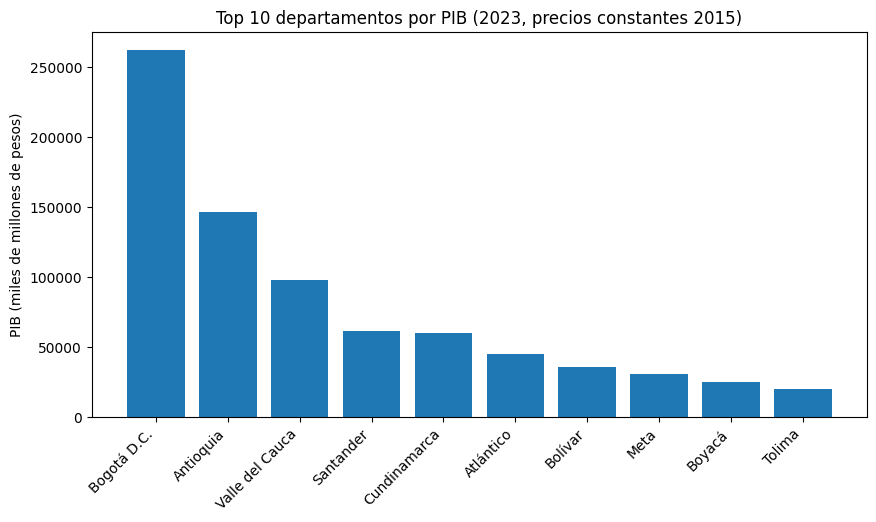

In [61]:
import matplotlib.pyplot as plt

top10 = df_depto.sort_values("Valor (miles de millones de pesos)", ascending=False).head(10)

plt.figure(figsize=(10,5))
plt.bar(top10["Departamento"], top10["Valor (miles de millones de pesos)"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("PIB (miles de millones de pesos)")
plt.title("Top 10 departamentos por PIB (2023, precios constantes 2015)")
plt.show()

In [62]:
df_depto_cod = (
    df_filtrado
    .groupby("Código Departamento (DIVIPOLA)", as_index=False)["Valor (miles de millones de pesos)"]
    .sum()
)
df_depto_cod.head()

,Código Departamento (DIVIPOLA),Valor (miles de millones de pesos)
0,5,146126.79
1,8,44690.11
2,11,261669.80
3,13,35868.10
4,15,24694.04


In [63]:
import geopandas as gpd

url_geojson = "https://gist.github.com/jofracerap/cd0e23a5dedc046879d32436646d28ab/raw/3aadedf47badbdac823b00dbe259f6bc6d9e1899/colombia.geo.json"
mapa = gpd.read_file(url_geojson)

mapa.columns, mapa.head()

(Index(['DPTO', 'NOMBRE_DPT', 'AREA', 'PERIMETER', 'HECTARES', 'geometry'], dtype='object'),
   DPTO             NOMBRE_DPT          AREA    PERIMETER     HECTARES  \
 0   05              ANTIOQUIA  6.335186e+10  1963728.843  6335185.555   
 1   08              ATLANTICO  3.360765e+09   240936.172   336076.535   
 2   11  SANTAFE DE BOGOTA D.C  1.650948e+09   323322.540   165094.778   
 3   13                BOLIVAR  2.614189e+10  1309427.968  2614189.453   
 4   15                 BOYACA  2.335258e+10  1364539.911  2335258.246   
 
                                             geometry  
 0  POLYGON ((-76.3073 8.6193, -76.2981 8.6164, -7...  
 1  POLYGON ((-74.8706 10.3612, -74.8764 10.3433, ...  
 2  POLYGON ((-74.0229 4.7951, -74.0264 4.7836, -7...  
 3  POLYGON ((-75.1595 10.4236, -75.1543 10.4097, ...  
 4  POLYGON ((-72.213 7.0275, -72.2061 7.0246, -72...  )

In [64]:
mapa["NOMBRE_DPT"] = mapa["NOMBRE_DPT"].str.strip().str.upper()
df_depto["Departamento"] = df_depto["Departamento"].str.strip().str.upper()

In [65]:
import unicodedata

def quitar_tildes(texto):
    return "".join(
        c for c in unicodedata.normalize("NFD", texto)
        if unicodedata.category(c) != "Mn"
    )

mapa["NOMBRE_DPT"] = mapa["NOMBRE_DPT"].apply(quitar_tildes)
df_depto["Departamento"] = df_depto["Departamento"].apply(quitar_tildes)

In [66]:
df_depto["Departamento"] = df_depto["Departamento"].replace({"BOGOTA D.C.": "BOGOTA D.C"})
mapa["NOMBRE_DPT"] = mapa["NOMBRE_DPT"].replace({"SANTAFE DE BOGOTA D.C": "BOGOTA D.C"})

In [67]:
mapa_datos = mapa.merge(
    df_depto,
    left_on="NOMBRE_DPT",
    right_on="Departamento",
    how="left"
)

A continuación, se presenta un mapa coroplético de Colombia que muestra la distribución espacial del PIB departamental para el año 2023, a precios constantes de 2015. Los departamentos con mayor PIB se representan en tonos verdes, mientras que aquellos con menor PIB se muestran en tonos rojos, permitiendo identificar patrones de concentración económica y contrastes territoriales.

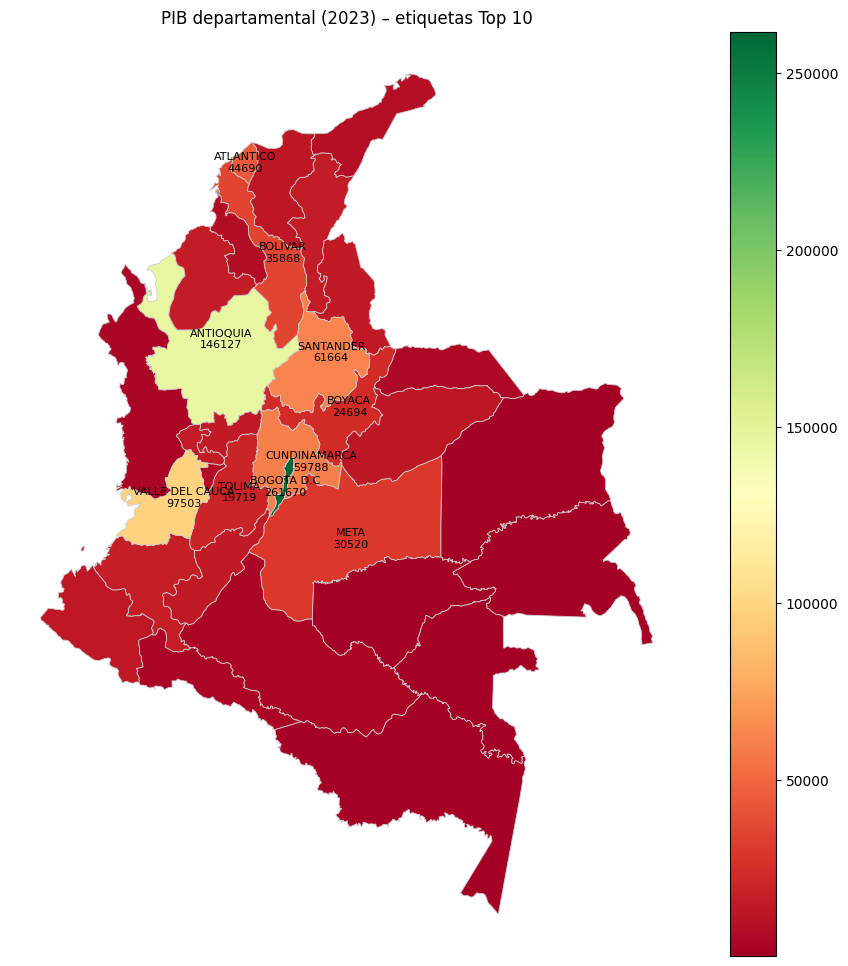

In [68]:
top = mapa_datos.nlargest(10, "Valor (miles de millones de pesos)")

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

mapa_datos.plot(
    column="Valor (miles de millones de pesos)",
    cmap="RdYlGn",
    legend=True,
    ax=ax,
    edgecolor="0.8",
    linewidth=0.6
)

top["punto"] = top.geometry.representative_point()

for _, row in top.iterrows():
    ax.text(
        row["punto"].x, row["punto"].y,
        f'{row["NOMBRE_DPT"]}\n{row["Valor (miles de millones de pesos)"]:.0f}',
        ha="center", va="center",
        fontsize=8
    )

ax.set_title("PIB departamental (2023) – etiquetas Top 10")
ax.axis("off")
plt.show()

Los tonos verdes representan departamentos con mayor PIB (2023, precios constantes 2015) y los rojos menor PIB. Se observa una concentración marcada en Bogotá D.C., Antioquia y Valle del Cauca, mientras varios departamentos periféricos registran menores niveles relativos.

In [69]:
import pandas as pd

mapa_datos["centro"] = mapa_datos.geometry.representative_point()
mapa_datos["lon"] = mapa_datos["centro"].x
mapa_datos["lat"] = mapa_datos["centro"].y

mapa_3d = mapa_datos[["NOMBRE_DPT", "lat", "lon", "Valor (miles de millones de pesos)"]].copy()
mapa_3d.head()

,NOMBRE_DPT,lat,lon,Valor (miles de millones de pesos)
0,ANTIOQUIA,7.17155,-75.472516,146126.79
1,ATLANTICO,10.67615,-75.003838,44690.11
2,BOGOTA D.C,4.23440,-74.196248,261669.80
3,BOLIVAR,8.88705,-74.250939,35868.10
4,BOYACA,5.83465,-72.920000,24694.04


xxx

In [70]:
import pandas as pd
import json

mapa_datos["pib"] = pd.to_numeric(
    mapa_datos["Valor (miles de millones de pesos)"],
    errors="coerce"
)

mapa_deck = mapa_datos[["NOMBRE_DPT", "pib", "geometry"]].dropna(subset=["pib"]).copy()

In [71]:
mapa_deck["centro"] = mapa_deck.geometry.representative_point()
mapa_deck["lon"] = mapa_deck["centro"].x
mapa_deck["lat"] = mapa_deck["centro"].y

top10 = mapa_deck.nlargest(10, "pib").copy()

In [72]:
import numpy as np

pib_min = mapa_deck["pib"].min()
pib_max = mapa_deck["pib"].max()

mapa_deck["color"] = mapa_deck["pib"].apply(
    lambda x: [
        int(255 * (1 - (x - pib_min) / (pib_max - pib_min))),
        int(255 * ((x - pib_min) / (pib_max - pib_min))),
        0
    ]
)

In [73]:
geojson_departamentos = json.loads(
    mapa_deck.drop(columns=["centro", "lon", "lat"], errors="ignore").to_json()
)

In [74]:
!pip -q install pydeck
import pydeck as pdk

In [75]:
ELEVATION_SCALE = 0.1

layer = pdk.Layer(
    "GeoJsonLayer",
    data=geojson_departamentos,
    pickable=True,
    stroked=True,
    filled=True,
    extruded=True,
    wireframe=True,
    get_elevation="properties.pib",
    elevation_scale=ELEVATION_SCALE,
    get_fill_color="properties.color",
    get_line_color=[80, 80, 80]
)

top10_text_data = top10[["NOMBRE_DPT", "lon", "lat", "pib"]].copy()

top10_text_data["altura_texto"] = top10_text_data["pib"] * ELEVATION_SCALE + 800

text_layer = pdk.Layer(
    "TextLayer",
    data=top10_text_data,
    get_position="[lon, lat]",
    get_text="NOMBRE_DPT",
    get_size=12,
    get_color=[255, 255, 255],
    get_text_anchor="'middle'",
    get_alignment_baseline="'bottom'",
    get_pixel_offset=[0, -25],
    billboard=True
)

view_state = pdk.ViewState(
    latitude=4.5,
    longitude=-74.0,
    zoom=4.2,
    pitch=65,
    bearing=20
)

r = pdk.Deck(
    layers=[layer, text_layer],
    initial_view_state=view_state,
    tooltip={"text": "{NOMBRE_DPT}\nPIB: {pib}"}
)

r

<IPython.core.display.Javascript object>

{
  "initialViewState": {
    "bearing": 20,
    "latitude": 4.5,
    "longitude": -74.0,
    "pitch": 65,
    "zoom": 4.2
  },
  "layers": [
    {
      "@@type": "GeoJsonLayer",
      "data": {
        "features": [
          {
            "geometry": {
              "coordinates": [
                [
                  [
                    -76.30729675220047,
                    8.619299889431787
                  ],
                  [
                    -76.29810333270866,
                    8.616399764640406
                  ],
                  [
                    -76.2917022709176,
                    8.617500305932477
                  ],
                  [
                    -76.27619934020201,
                    8.60879993391571
                  ],
                  [
                    -76.26290130676628,
                    8.603500365680683
                  ],
                  [
                    -76.25189971939517,
                    8.593600272668734
                  ],
                  [
                    -76.2397994998317,
                    8.58959960902182
                  ],
                  [
                    -76.22709655816153,
                    8.583700180478338
                  ],
                  [
                    -76.2276992798516,
                    8.579099655292133
                  ],
                  [
                    -76.21730041464741,
                    8.571599959760825
                  ],
                  [
                    -76.21620178287812,
                    8.56400012950135
                  ],
                  [
                    -76.2144012458417,
                    8.551300048733623
                  ],
                  [
                    -76.21209716764655,
                    8.53460025816843
                  ],
                  [
                    -76.2115020744161,
                    8.521900177648424
                  ],
                  [
                    -76.20809936534768,
                    8.50100040489879
                  ],
                  [
                    -76.20520019535385,
                    8.487700462096564
                  ],
                  [
                    -76.20169830239917,
                    8.471599578043385
                  ],
                  [
                    -76.20059966999881,
                    8.46399974867111
                  ],
                  [
                    -76.19770050024864,
                    8.451299668030343
                  ],
                  [
                    -76.19589996263814,
                    8.437999725351512
                  ],
                  [
                    -76.19539642299272,
                    8.426500319746971
                  ],
                  [
                    -76.1965026855125,
                    8.418399811395048
                  ],
                  [
                    -76.2005004890775,
                    8.41670036392434
                  ],
                  [
                    -76.21949767980999,
                    8.402299880581914
                  ],
                  [
                    -76.23400115901345,
                    8.388500214292852
                  ],
                  [
                    -76.24659729022095,
                    8.375300407594413
                  ],
                  [
                    -76.25409698408104,
                    8.369500160819292
                  ],
                  [
                    -76.26560211262651,
                    8.349900245476581
                  ],
                  [
                    -76.28350067154241,
                    8.318300247253106
                  ],
                  [
                    -76.2990036010339,
                    8.294599532291839
                  ],
                  [
                    -76.31230163652167,
                    8.27449989342478
                  ],
                  [
  

La altura de cada departamento representa el PIB y refuerza visualmente la concentración económica. Se etiqueta el top 10 para facilitar lectura sin saturar el mapa; el valor exacto se consulta en el tooltip.

In [76]:
top10[["NOMBRE_DPT","pib"]].sort_values("pib", ascending=False).reset_index(drop=True)

,NOMBRE_DPT,pib
0,BOGOTA D.C,261669.80
1,ANTIOQUIA,146126.79
2,VALLE DEL CAUCA,97502.75
3,SANTANDER,61664.41
4,CUNDINAMARCA,59788.20
5,ATLANTICO,44690.11
6,BOLIVAR,35868.10
7,META,30520.02
8,BOYACA,24694.04
9,TOLIMA,19719.02


En 2023 el PIB departamental muestra una distribución desigual, con alta concentración en pocos territorios. Las visualizaciones 2D y 3D permiten identificar patrones de centralización y contrastes regionales, útiles para análisis territorial y priorización de políticas públicas.